# Clusterizacao - Case ImdbMovies

# IMDb TOP 250 Movies
![An image](https://static.amazon.jobs/teams/53/images/IMDb_Header_Page.jpg?1501027252)

**Este projeto consiste em treinar um sistema de recomendação de filmes utilizando as informações referentes aos top 250 filmes melhor avaliados pelo público na plataforma IMDb.**
*   A extração dos dados será feita por técnicas de web scraping (crawler).
*   O objetivo principal será agrupar os 250 filmes em "n" clusters classificados a partir das suas sinopses, aplicando técnicas de processamento de texto e algoritmos de clusterização.
*   Ao final, teremos um sistemas de recomendação baseado na similaridade das sinopses, e não apenas dos generos.

**Exemplo de aplicação prática: usuários receberão recomendações de filmes que estejam no mesmo cluster de sinopses de outros filmes que ele já tenha curtido.**

# Import das bibliotecas

In [60]:
!pip install yellowbrick

In [61]:
import pandas as pd
import numpy as np
import requests
from pprint import pprint
from bs4 import BeautifulSoup
import re
import json
from urllib.request import Request, urlopen
from lxml import html
import time
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
from wordcloud import WordCloud
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.cluster import KMeans
from yellowbrick.cluster import KElbowVisualizer, SilhouetteVisualizer

# Web Scraping / Crawler

In [62]:
userAgents=[
    "Mozilla/5.0 (X11; Linux x86_64) AppleWebKit/537.36 (KHTML, like Gecko) HeadlessChrome/74.0.3729.157 Safari/537.36",
    "Mozilla/5.0 (Macintosh; Intel Mac OS X 10_14_5) AppleWebKit/605.1.15 (KHTML, like Gecko) Version/12.1.1 Safari/605.1.15"]

url = 'https://www.imdb.com/chart/top/?ref_=nv_mv_250'
response = requests.get(url, headers={"User-agent": userAgents[1]})
response

<Response [200]>

In [63]:
html = response.text
html

'<!DOCTYPE html><html lang="en-US" xmlns:og="http://opengraphprotocol.org/schema/" xmlns:fb="http://www.facebook.com/2008/fbml"><head><meta charSet="utf-8"/><meta name="viewport" content="width=device-width"/><script>if(typeof uet === \'function\'){ uet(\'bb\', \'LoadTitle\', {wb: 1}); }</script><script>window.addEventListener(\'load\', (event) => {\n        if (typeof window.csa !== \'undefined\' && typeof window.csa === \'function\') {\n            var csaLatencyPlugin = window.csa(\'Content\', {\n                element: {\n                    slotId: \'LoadTitle\',\n                    type: \'service-call\'\n                }\n            });\n            csaLatencyPlugin(\'mark\', \'clickToBodyBegin\', 1693492963190);\n        }\n    })</script><title>IMDb Top 250 Movies</title><meta name="description" content="IMDb Top 250 as rated by regular IMDb voters" data-id="main"/><meta property="og:site_name" content="IMDb"/><meta property="og:title" content="IMDb Top 250 Movies"/><meta 

In [64]:
#BeautifulSoup
bs = BeautifulSoup(html)
pprint(bs)


<!DOCTYPE html>
<html lang="en-US" xmlns:fb="http://www.facebook.com/2008/fbml" xmlns:og="http://opengraphprotocol.org/schema/"><head><meta charset="utf-8"/><meta content="width=device-width" name="viewport"/><script>if(typeof uet === 'function'){ uet('bb', 'LoadTitle', {wb: 1}); }</script><script>window.addEventListener('load', (event) => {
        if (typeof window.csa !== 'undefined' && typeof window.csa === 'function') {
            var csaLatencyPlugin = window.csa('Content', {
                element: {
                    slotId: 'LoadTitle',
                    type: 'service-call'
                }
            });
            csaLatencyPlugin('mark', 'clickToBodyBegin', 1693492963190);
        }
    })</script><title>IMDb Top 250 Movies</title><meta content="IMDb Top 250 as rated by regular IMDb voters" data-id="main" name="description"/><meta content="IMDb" property="og:site_name"/><meta content="IMDb Top 250 Movies" property="og:title"/><meta content="IMDb Top 250 as rated b

## Title EN

In [65]:
titles = bs.find_all('h3', attrs={'class': 'ipc-title__text'})
titles


[<h3 class="ipc-title__text">IMDb Charts</h3>,
 <h3 class="ipc-title__text">1. Um Sonho de Liberdade</h3>,
 <h3 class="ipc-title__text">2. O Poderoso Chefão</h3>,
 <h3 class="ipc-title__text">3. Batman: O Cavaleiro das Trevas</h3>,
 <h3 class="ipc-title__text">4. O Poderoso Chefão II</h3>,
 <h3 class="ipc-title__text">5. 12 Homens e uma Sentença</h3>,
 <h3 class="ipc-title__text">6. A Lista de Schindler</h3>,
 <h3 class="ipc-title__text">7. O Senhor dos Anéis: O Retorno do Rei</h3>,
 <h3 class="ipc-title__text">8. Pulp Fiction - Tempo de Violência</h3>,
 <h3 class="ipc-title__text">9. O Senhor dos Anéis: A Sociedade do Anel</h3>,
 <h3 class="ipc-title__text">10. Três Homens em Conflito</h3>,
 <h3 class="ipc-title__text">11. Forrest Gump: O Contador de Histórias</h3>,
 <h3 class="ipc-title__text">12. Clube da Luta</h3>,
 <h3 class="ipc-title__text">13. O Senhor dos Anéis: As Duas Torres</h3>,
 <h3 class="ipc-title__text">14. A Origem</h3>,
 <h3 class="ipc-title__text">15. Star Wars: Epi

In [66]:
list_title_en = []
for x in titles[1:-12]:
  tit = (x.text).split(">")[0].strip()
  list_title_en.append(tit)

display(len(list_title_en))
list_title_en[:5]

250

['1. Um Sonho de Liberdade',
 '2. O Poderoso Chefão',
 '3. Batman: O Cavaleiro das Trevas',
 '4. O Poderoso Chefão II',
 '5. 12 Homens e uma Sentença']

## Year

In [67]:
list_years = []
years = bs.find_all('div', attrs={'class':'sc-b85248f1-5 kZGNjY cli-title-metadata'})
for y in years:
  year = y.find('span', attrs={'class':'sc-b85248f1-6 bnDqKN cli-title-metadata-item'}).text
  list_years.append(year)
display(len(list_years))
list_years[:5]

250

['1994', '1972', '2008', '1974', '1957']

## Rating

In [68]:
ratings = bs.find_all('div', attrs={'class':'sc-e3e7b191-0 iKUUVe sc-b85248f1-2 wTpct cli-ratings-container'})
list_rating = []
for r in ratings:
  rating = r.find('span').text[:3]
  list_rating.append(rating)

display(len(list_rating))
pprint(list_rating[:5])

250

['9.3', '9.2', '9.0', '9.0', '9.0']


## Genre, Title PT & Year

In [69]:
list_links = []
for a in bs.find_all('a', href=True):
  if '/title/' in a['href'] and 'https://www.imdb.com/'+ a['href'] not in list_links:
    list_links.append(('https://www.imdb.com/'+a['href'])[:-15])

#Remove duplicates
list_links = list(dict.fromkeys(list_links))
#Deleting first element
list_links = list_links[1:]

display(len(list_links))
list_links[:5]

250

['https://www.imdb.com//title/tt0111161/',
 'https://www.imdb.com//title/tt0068646/',
 'https://www.imdb.com//title/tt0468569/',
 'https://www.imdb.com//title/tt0071562/',
 'https://www.imdb.com//title/tt0050083/']

In [70]:
headers = {
          'authority': 'www.amazon.com.br',
          'accept': 'text/html,application/xhtml+xml,application/xml;q=0.9,image/avif,image/webp,image/apng,*/*;q=0.8,application/signed-exchange;v=b3;q=0.7',
          'accept-language': 'pt-BR,pt;q=0.9,en-US;q=0.8,en;q=0.7',
          'cache-control': 'max-age=0',
          'device-memory': '8',
          'downlink': '10',
          'dpr': '1.875',
          'ect': '4g',
          'rtt': '50',
          'sec-ch-device-memory': '8',
          'sec-ch-dpr': '1.875',
          'sec-ch-ua': '"Chromium";v="110", "Not A(Brand";v="24", "Google Chrome";v="110"',
          'sec-ch-ua-mobile': '?0',
          'sec-ch-ua-platform': '"Windows"',
          'sec-ch-ua-platform-version': '"10.0.0"',
          'sec-ch-viewport-width': '455',
          'sec-fetch-dest': 'document',
          'sec-fetch-mode': 'navigate',
          'sec-fetch-site': 'none',
          'sec-fetch-user': '?1',
          'upgrade-insecure-requests': '1',
          'user-agent': 'Mozilla/5.0 (Windows NT 10.0; Win64; x64) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/110.0.0.0 Safari/537.36',
          'viewport-width': '455',
          }
############################################################
list_genre = []
list_title_pt = []
list_year = []
list_sinopse = []

for link in list_links:
  time.sleep(.5)
  response = requests.get(link, headers = headers)
  html = response.content
  soup = BeautifulSoup(html, "html.parser")

  #genre
  try:
    for genre in soup.find('span', {'class':'ipc-chip__text'}):
      genre = genre.text
      list_genre.append(genre)
  except:
      list_genre.append(np.nan)
      print('Nan')

  #title_PT and year
  try:
    for x in soup.find('title'):
      #title_pt
      title_pt = (x.text)[:-14].strip()
      list_title_pt.append(title_pt)
      #year
      year = (x.text)[-12:-8].strip()
      list_year.append(year)

  except:
    list_title_pt.append(np.nan)
    list_year.append(np.nan)

  #sinopse
  try:
    for sin in soup.find('span', {"data-testid":"plot-xl"}):
      sinopse = sin.text
      list_sinopse.append(sinopse)
  except:
    list_sinopse.append(np.nan)

  print(genre, title_pt, year, sinopse[:20])

display(len(list_genre), len(list_title_pt), len(list_year), len(list_sinopse))
print(list_genre[:5])
print(list_title_pt[:5])
print(list_year[:5])
display(list_sinopse[:2])

Drama Um Sonho de Liberdade 1994 Dois homens presos s
Policial O Poderoso Chefão 1972 O patriarca idoso de
Ação Batman: O Cavaleiro das Trevas 2008 Quando a ameaça conh
Policial O Poderoso Chefão II 1974 Em 1950, Michael Cor
Policial 12 Homens e uma Sentença 1957 O julgamento de um a
Biografia A Lista de Schindler 1993 Na Polônia ocupada p
Ação O Senhor dos Anéis: O Retorno do Rei 2003 Gandalf e Aragorn li
Policial Pulp Fiction - Tempo de Violência 1994 As vidas de dois ass
Ação O Senhor dos Anéis: A Sociedade do Anel 2001 Um manso hobbit do C
Aventura Três Homens em Conflito 1966 Um impostor se junta
Drama Forrest Gump: O Contador de Histórias 1994 Os governos dos pres
Drama Clube da Luta 1999 Um trabalhador de es
Ação O Senhor dos Anéis: As Duas Torres 2002 Enquanto Frodo e Sam
Ação A Origem 2010 Um ladrão que rouba 
Ação Star Wars: Episódio V - O Império Contra-Ataca 1980 Os rebeldes derrotar
Ação Matrix 1999 Um hacker aprende co
Biografia Os Bons Companheiros 1990 A historia do Hen

250

250

250

250

['Drama', 'Policial', 'Ação', 'Policial', 'Policial']
['Um Sonho de Liberdade', 'O Poderoso Chefão', 'Batman: O Cavaleiro das Trevas', 'O Poderoso Chefão II', '12 Homens e uma Sentença']
['1994', '1972', '2008', '1974', '1957']


['Dois homens presos se reúnem ao longo de vários anos, encontrando consolo e eventual redenção através de atos de decência comum.',
 'O patriarca idoso de uma dinastia do crime organizado transfere o controle de seu império clandestino para seu filho relutante.']

## DataFrame

In [71]:
df = pd.DataFrame({'title_pt':list_title_pt,
                   'title_en':list_title_en,
                   'year':list_year,
                   'rating':list_year,
                   'genre':list_genre,
                   'sinopse': list_sinopse})
df.sort_values('year', inplace = True)

##Only in case of historizing each 250 movies queried
##path_export = 'path/top250_movies.csv'

df.to_csv('top250_movies.csv', sep = ';',index = False)
df.head()

,title_pt,title_en,year,rating,genre,sinopse
130,O Garoto,131. O Garoto,1921,1921,Comédia,"Um mendigo cuida de uma criança abandonada, ma..."
197,Bancando o Águia,198. Bancando o Águia,1924,1924,Ação,Um projecionista de cinema deseja ser um detet...
182,Em Busca do Ouro,183. Em Busca do Ouro,1925,1925,Aventura,Um garimpeiro vai ao Klondike em busca de ouro...
190,A General,191. A General,1926,1926,Ação,Uns espiões roubam a amada locomotiva de um en...
116,Metrópolis,117. Metrópolis,1927,1927,Drama,Numa cidade futurística dividida entre os trab...


In [72]:
from datetime import datetime
today = datetime.today().strftime('%Y%m%d')
today

'20230831'

In [73]:
df.to_csv(f'movies/top250_movies_{today}.csv',sep=";",index=False)

Merge with Historical

In [74]:
from glob import glob

In [75]:
list_files = []
for file in glob('movies/*.csv'):
    list_files.append(file)

list_df = []
c = 0
for file in list_files:
    print(f'{c+1} of {len(list_files)} | {file}')
    df_temp = pd.read_csv(file,sep=";")
    list_df.append(df_temp)
    c += 1
    
df_historical = pd.concat(list_df,axis=0,copy=False)
df_historical = df_historical.drop_duplicates(subset=['title_pt'],keep='last')
df_historical = df_historical.reset_index(drop=True)
display(df_historical.shape)
display(df_historical)

1 of 3 | movies\all_movies.csv
2 of 3 | movies\top250_movies_20230830.csv
3 of 3 | movies\top250_movies_20230831.csv


(249, 6)

,title_pt,title_en,year,rating,genre,sinopse
0,O Garoto,131. O Garoto,1921,1921,Comédia,"Um mendigo cuida de uma criança abandonada, ma..."
1,Bancando o Águia,198. Bancando o Águia,1924,1924,Ação,Um projecionista de cinema deseja ser um detet...
2,Em Busca do Ouro,183. Em Busca do Ouro,1925,1925,Aventura,Um garimpeiro vai ao Klondike em busca de ouro...
3,A General,191. A General,1926,1926,Ação,Uns espiões roubam a amada locomotiva de um en...
4,Metrópolis,117. Metrópolis,1927,1927,Drama,Numa cidade futurística dividida entre os trab...
...,...,...,...,...,...,...
244,Jai Bhim,219. Jai Bhim,2021,2021,Policial,Quando um homem tribal é preso por um caso de ...
245,Homem-Aranha: Sem Volta para Casa,158. Homem-Aranha: Sem Volta para Casa,2021,2021,Ação,"Com a identidade do Homem-Aranha revelada, Pet..."
246,Top Gun: Maverick,127. Top Gun: Maverick,2022,2022,Ação,Após mais de trinta anos de serviço como um do...
247,Oppenheimer,36. Oppenheimer,2023,2023,Biografia,A história do cientista americano J. Robert Op...


In [76]:
df_historical.to_csv('movies/all_movies.csv',sep=";",index=False)

# Enriquecendo a base de filmes com outras categorias: séries

In [158]:
userAgents=[
    "Mozilla/5.0 (X11; Linux x86_64) AppleWebKit/537.36 (KHTML, like Gecko) HeadlessChrome/74.0.3729.157 Safari/537.36",
    "Mozilla/5.0 (Macintosh; Intel Mac OS X 10_14_5) AppleWebKit/605.1.15 (KHTML, like Gecko) Version/12.1.1 Safari/605.1.15"]

url = 'https://www.imdb.com/chart/toptv/?ref_=chtbo_ql_6'
response = requests.get(url, headers={"User-agent": userAgents[1]})
response

<Response [200]>

In [159]:
html = response.text
html

'<!DOCTYPE html><html lang="en-US" xmlns:og="http://opengraphprotocol.org/schema/" xmlns:fb="http://www.facebook.com/2008/fbml"><head><meta charSet="utf-8"/><meta name="viewport" content="width=device-width"/><script>if(typeof uet === \'function\'){ uet(\'bb\', \'LoadTitle\', {wb: 1}); }</script><script>window.addEventListener(\'load\', (event) => {\n        if (typeof window.csa !== \'undefined\' && typeof window.csa === \'function\') {\n            var csaLatencyPlugin = window.csa(\'Content\', {\n                element: {\n                    slotId: \'LoadTitle\',\n                    type: \'service-call\'\n                }\n            });\n            csaLatencyPlugin(\'mark\', \'clickToBodyBegin\', 1693505716651);\n        }\n    })</script><title>Top 250 TV Shows</title><meta name="description" content="Top 250 TV Shows" data-id="main"/><meta property="og:site_name" content="IMDb"/><meta property="og:title" content="Top 250 TV Shows"/><meta property="og:description" content=

In [160]:
#BeautifulSoup
bs = BeautifulSoup(html)

In [161]:
titles = bs.find_all('h3', attrs={'class': 'ipc-title__text'})
titles

[<h3 class="ipc-title__text">IMDb Charts</h3>,
 <h3 class="ipc-title__text">1. Breaking Bad</h3>,
 <h3 class="ipc-title__text">2. Planeta Terra II</h3>,
 <h3 class="ipc-title__text">3. Planeta Terra</h3>,
 <h3 class="ipc-title__text">4. Irmãos de Guerra</h3>,
 <h3 class="ipc-title__text">5. Chernobyl</h3>,
 <h3 class="ipc-title__text">6. A Escuta</h3>,
 <h3 class="ipc-title__text">7. Avatar: A Lenda de Aang</h3>,
 <h3 class="ipc-title__text">8. Planeta Azul II</h3>,
 <h3 class="ipc-title__text">9. Família Soprano</h3>,
 <h3 class="ipc-title__text">10. Cosmos: Uma Odisseia do Espaço-Tempo</h3>,
 <h3 class="ipc-title__text">11. Cosmos</h3>,
 <h3 class="ipc-title__text">12. Nosso Planeta</h3>,
 <h3 class="ipc-title__text">13. Game of Thrones</h3>,
 <h3 class="ipc-title__text">14. O Mundo em Guerra</h3>,
 <h3 class="ipc-title__text">15. Rick e Morty</h3>,
 <h3 class="ipc-title__text">16. Bluey</h3>,
 <h3 class="ipc-title__text">17. Fullmetal Alchemist: Brotherhood</h3>,
 <h3 class="ipc-tit

Títulos

In [162]:
list_title_en = []
for x in titles[1:-12]:
  tit = (x.text).split(">")[0].strip()
  list_title_en.append(tit)

In [163]:
display(len(list_title_en))
list_title_en[:5]

250

['1. Breaking Bad',
 '2. Planeta Terra II',
 '3. Planeta Terra',
 '4. Irmãos de Guerra',
 '5. Chernobyl']

Ano

In [164]:
len(list_title_pt)

250

In [167]:
set(list_years)

{'1976',
 '1980',
 '1985',
 '1986',
 '1987',
 '1989',
 '1990',
 '1995',
 '1998',
 '1999',
 '2001',
 '2003',
 '2004',
 '2008',
 '2009',
 '2011',
 '2013',
 '2014',
 '2015',
 '2016',
 '2017',
 '2018',
 '2019',
 '2020',
 '2021',
 '2022'}

In [165]:
list_years = []
years = bs.find_all('div', attrs={'class':'sc-b85248f1-5 kZGNjY cli-title-metadata'})
for y in years:
  year = y.find('span', attrs={'class':'sc-b85248f1-6 bnDqKN cli-title-metadata-item'}).text
  if '–' in year:  # Verificar se contém um hífen
    anos = elemento.split('–')  # Dividir com base no hífen
    ultimo_ano = anos[-1]  # Pegar o último ano
  else:
    ultimo_ano = year  # Se não tiver hífen, pegar o ano como está
  list_years.append(ultimo_ano) 

display(len(list_years))
list_years[:20]

250

['2019',
 '2016',
 '2019',
 '2001',
 '2019',
 '2019',
 '2019',
 '2017',
 '2019',
 '2014',
 '1980',
 '2019',
 '2019',
 '2019',
 '2019',
 '2019',
 '2019',
 '2020',
 '2009',
 '2019']

Rating

In [129]:
ratings = bs.find_all('div', attrs={'class':'sc-e3e7b191-0 iKUUVe sc-b85248f1-2 wTpct cli-ratings-container'})
list_rating = []
for r in ratings:
  rating = r.find('span').text[:3]
  list_rating.append(rating)

In [130]:
display(len(list_rating))
pprint(list_rating[:5])

250

['9.5', '9.5', '9.4', '9.4', '9.4']


Links

In [131]:
list_links = []
for a in bs.find_all('a', href=True):
  if '/title/' in a['href'] and 'https://www.imdb.com/'+ a['href'] not in list_links:
    list_links.append(('https://www.imdb.com/'+a['href'])[:-15])

In [132]:
#Remove duplicates
list_links = list(dict.fromkeys(list_links))
#Deleting first element
list_links = list_links[1:]

In [133]:
display(len(list_links))
list_links[:5]

250

['https://www.imdb.com//title/tt0903747/?r',
 'https://www.imdb.com//title/tt5491994/?r',
 'https://www.imdb.com//title/tt0795176/?r',
 'https://www.imdb.com//title/tt0185906/?r',
 'https://www.imdb.com//title/tt7366338/?r']

In [134]:
headers = {
          'authority': 'www.amazon.com.br',
          'accept': 'text/html,application/xhtml+xml,application/xml;q=0.9,image/avif,image/webp,image/apng,*/*;q=0.8,application/signed-exchange;v=b3;q=0.7',
          'accept-language': 'pt-BR,pt;q=0.9,en-US;q=0.8,en;q=0.7',
          'cache-control': 'max-age=0',
          'device-memory': '8',
          'downlink': '10',
          'dpr': '1.875',
          'ect': '4g',
          'rtt': '50',
          'sec-ch-device-memory': '8',
          'sec-ch-dpr': '1.875',
          'sec-ch-ua': '"Chromium";v="110", "Not A(Brand";v="24", "Google Chrome";v="110"',
          'sec-ch-ua-mobile': '?0',
          'sec-ch-ua-platform': '"Windows"',
          'sec-ch-ua-platform-version': '"10.0.0"',
          'sec-ch-viewport-width': '455',
          'sec-fetch-dest': 'document',
          'sec-fetch-mode': 'navigate',
          'sec-fetch-site': 'none',
          'sec-fetch-user': '?1',
          'upgrade-insecure-requests': '1',
          'user-agent': 'Mozilla/5.0 (Windows NT 10.0; Win64; x64) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/110.0.0.0 Safari/537.36',
          'viewport-width': '455',
          }

In [137]:
############################################################
list_genre = []
list_title_pt = []
list_year = []
list_sinopse = []

In [138]:
for link in list_links:
  time.sleep(.5)
  response = requests.get(link, headers = headers)
  html = response.content
  soup = BeautifulSoup(html, "html.parser")

  #genre
  try:
    for genre in soup.find('span', {'class':'ipc-chip__text'}):
      genre = genre.text
      list_genre.append(genre)
  except:
      list_genre.append(np.nan)
      print('Nan')

  #title_PT and year
  try:
    for x in soup.find('title'):
      #title_pt
      title_pt = (x.text)[:-14].strip()
      list_title_pt.append(title_pt)
      #year
      year = (x.text)[-12:-8].strip()
      list_year.append(year)

  except:
    list_title_pt.append(np.nan)
    list_year.append(np.nan)

  #sinopse
  try:
    for sin in soup.find('span', {"data-testid":"plot-xl"}):
      sinopse = sin.text
      list_sinopse.append(sinopse)
  except:
    list_sinopse.append(np.nan)

  print(genre, title_pt, year, sinopse[:20])

display(len(list_genre), len(list_title_pt), len(list_year), len(list_sinopse))
print(list_genre[:5])
print(list_title_pt[:5])
print(list_year[:5])
display(list_sinopse[:2])

Policial Breaking Bad (Série de TV 200 2013 Um professor de quím
Documentário Planeta Terra II (Minissérie de televisã 2016 Série de documentári
Documentário Planeta Terra (Minissérie de televisão 200 2023 Premiada com o Emmy,
Drama Irmãos de Guerra (Minissérie de televisã 2001 A história da Easy C
Drama Chernobyl (Minissérie de televisã 2019 Minissérie em cinco 
Policial A Escuta (Série de TV 200 2008 Cena de drogas, vist
Animação Avatar: A Lenda de Aang (Série de TV 200 2008 Num mundo em guerra 
Documentário Planeta Azul II (Minissérie de televisã 2017 David Attenborough r
Policial Família Soprano (Série de TV 199 2007 O chefe da máfia de 
Documentário Cosmos: Uma Odisseia do Espaço-Tempo (Minissérie de televisã 2014 Uma exploração das d
Documentário Cosmos (Minissérie de televisã 1980 O astrônomo Carl Sag
Documentário Nosso Planeta (Série de TV 201 2023 Experimentando a bel
Ação Game of Thrones (Série de TV 201 2019 Nove famílias nobres
Documentário O Mundo em Guerra (Série de TV 19

250

250

250

258

['Policial', 'Documentário', 'Documentário', 'Drama', 'Drama']
['Breaking Bad (Série de TV 200', 'Planeta Terra II (Minissérie de televisã', 'Planeta Terra (Minissérie de televisão 200', 'Irmãos de Guerra (Minissérie de televisã', 'Chernobyl (Minissérie de televisã']
['2013', '2016', '2023', '2001', '2019']


['Um professor de química diagnosticado com câncer de pulmão se transforma em fabricante e vendedor de metanfetamina, a fim de garantir o futuro da sua família.',
 'Série de documentários sobre vida selvagem com David Attenborough, com um olhar sobre as ilhas remotas que oferecem santuário para algumas das criaturas mais raras do planeta, para a beleza das cidades, que abrigam humanos e animais.']

In [148]:
list_sinopse = list_sinopse[:250]

Length of list_title_pt: 250
Length of list_title_en: 250
Length of list_year: 250
Length of list_rating: 250
Length of list_genre: 250
Length of list_sinopse: 250


In [149]:
df = pd.DataFrame({'title_pt':list_title_pt,
                   'title_en':list_title_en,
                   'year':list_year,
                   'rating':list_rating,
                   'genre':list_genre,
                   'sinopse': list_sinopse})

df.sort_values('year', inplace = True)

##Only in case of historizing each 250 movies queried
##path_export = 'path/top250_movies.csv'

#df.to_csv('top250_movies.csv', sep = ';',index = False)
#df.head()

from datetime import datetime
today = datetime.today().strftime('%Y%m%d')
today

df.to_csv(f'movies/top250_series_{today}.csv',sep=";",index=False)

In [178]:
from glob import glob

list_files = []
for file in glob('movies/*.csv'):
    list_files.append(file)

list_df = []
c = 0
for file in list_files:
    print(f'{c+1} of {len(list_files)} | {file}')
    df_temp = pd.read_csv(file,sep=";")
    list_df.append(df_temp)
    c += 1
    
df_historical = pd.concat(list_df,axis=0,copy=False)
df_historical = df_historical.drop_duplicates(subset=['title_pt'],keep='last')
df_historical = df_historical.reset_index(drop=True)
display(df_historical.shape)
display(df_historical)

df_historical.to_csv('movies/all_movies.csv',sep=";",index=False)

1 of 4 | movies\all_movies.csv
2 of 4 | movies\top250_movies_20230830.csv
3 of 4 | movies\top250_movies_20230831.csv
4 of 4 | movies\top250_series_20230831.csv


(498, 6)

,title_pt,title_en,year,rating,genre,sinopse
0,O Garoto,131. O Garoto,1921,1921.0,Comédia,"Um mendigo cuida de uma criança abandonada, ma..."
1,Bancando o Águia,198. Bancando o Águia,1924,1924.0,Ação,Um projecionista de cinema deseja ser um detet...
2,Em Busca do Ouro,183. Em Busca do Ouro,1925,1925.0,Aventura,Um garimpeiro vai ao Klondike em busca de ouro...
3,A General,191. A General,1926,1926.0,Ação,Uns espiões roubam a amada locomotiva de um en...
4,Metrópolis,117. Metrópolis,1927,1927.0,Drama,Numa cidade futurística dividida entre os trab...
...,...,...,...,...,...,...
493,O Urso (Série de TV,196. O Urso,22–,8.6,Comédia,"As desventuras cômicas de Roy, Moss e sua enge..."
494,The Last of Us (Série de TV,72. The Last of Us,23–,8.8,Ação,O comediante Dave Chappelle é o apresentador d...
495,Os Simpsons (Série de TV,93. Os Simpsons,89–,8.7,Animação,Comédia adaptada sobre uma jovem tentando lida...
496,South Park (Série de TV,76. South Park,97–,8.7,Animação,The personal and governmental affairs of the J...


#EDA - Exploratory Data Analysis

In [179]:
df = pd.read_csv('movies/all_movies.csv', sep = ';')

print(df.shape)
df.head()

(498, 6)


,title_pt,title_en,year,rating,genre,sinopse
0,O Garoto,131. O Garoto,1921,1921.0,Comédia,"Um mendigo cuida de uma criança abandonada, ma..."
1,Bancando o Águia,198. Bancando o Águia,1924,1924.0,Ação,Um projecionista de cinema deseja ser um detet...
2,Em Busca do Ouro,183. Em Busca do Ouro,1925,1925.0,Aventura,Um garimpeiro vai ao Klondike em busca de ouro...
3,A General,191. A General,1926,1926.0,Ação,Uns espiões roubam a amada locomotiva de um en...
4,Metrópolis,117. Metrópolis,1927,1927.0,Drama,Numa cidade futurística dividida entre os trab...


In [180]:
df[df['year'] == "14–"]

,title_pt,title_en,year,rating,genre,sinopse
259,True Detective (Série de TV,38. True Detective,14–,8.9,Policial,"O Gon tenta encontrar a pai, quem o deixo quan..."
260,Last Week Tonight with John Oliver (Série de TV,47. Last Week Tonight with John Oliver,14–,8.9,Comédia,"Dois irmãos gemeios, o Dipper e a Mabel Pines ..."


In [181]:
df['year'].unique()

array(['1921', '1924', '1925', '1926', '1927', '1928', '1931', '1934',
       '1936', '1939', '1940', '1941', '1942', '1944', '1946', '1947',
       '1948', '1949', '1950', '1952', '1953', '1954', '1955', '1957',
       '1958', '1959', '1960', '1961', '1962', '1963', '1964', '1965',
       '1966', '1967', '1968', '1971', '1972', '1973', '1974', '1975',
       '1976', '1977', '1978', '1979', '1980', '1981', '1982', '1983',
       '1984', '1985', '1986', '1987', '1988', '1989', '1990', '1991',
       '1992', '1993', '1994', '1995', '1996', '1997', '1998', '1999',
       '2000', '2001', '2002', '2003', '2004', '2005', '2006', '2007',
       '2008', '2009', '2010', '2011', '2012', '2013', '2014', '2015',
       '2016', '2017', '2018', '2019', '2020', '2021', '2022', '2023',
       '00–', '02–', '03–', '04–', '05–', '11–', '12–', '13–', '14–',
       '15–', '16–', '17–', '18–', '19–', '2024', '2025', '20–', '21–',
       '22–', '23–', '89–', '97–', '99–'], dtype=object)

In [182]:
df.shape[0]

498

In [184]:
anos_validos = ['1921', '1924', '1925', '1926', '1927', '1928', '1931', '1934',
       '1936', '1939', '1940', '1941', '1942', '1944', '1946', '1947',
       '1948', '1949', '1950', '1952', '1953', '1954', '1955', '1957',
       '1958', '1959', '1960', '1961', '1962', '1963', '1964', '1965',
       '1966', '1967', '1968', '1971', '1972', '1973', '1974', '1975',
       '1976', '1977', '1978', '1979', '1980', '1981', '1982', '1983',
       '1984', '1985', '1986', '1987', '1988', '1989', '1990', '1991',
       '1992', '1993', '1994', '1995', '1996', '1997', '1998', '1999',
       '2000', '2001', '2002', '2003', '2004', '2005', '2006', '2007',
       '2008', '2009', '2010', '2011', '2012', '2013', '2014', '2015',
       '2016', '2017', '2018', '2019', '2020', '2021', '2022', '2023','2024','2025','2026']
# Adjusting variable types
df = df[df['year'].isin(anos_validos)]
df['year'] = df['year'].astype('int64')
df['rating'] = df['rating'].astype('float64')

In [185]:
df.shape[0]

452

In [186]:
df.describe()

,year,rating
count,452.000000,452.000000
mean,1997.283186,1098.417920
std,23.782074,985.148778
min,1921.000000,8.400000
25%,1986.000000,8.700000
50%,2004.000000,1947.500000
75%,2016.000000,1997.000000
max,2025.000000,2023.000000


## Plots

In [187]:
df.genre.value_counts('d')

Drama           0.216814
Policial        0.163717
Comédia         0.159292
Animação        0.137168
Ação            0.128319
Biografia       0.064159
Aventura        0.055310
Documentário    0.053097
Mistério        0.008850
Terror          0.008850
Filme noir      0.002212
Faroeste        0.002212
Name: genre, dtype: float64

In [188]:
fig = px.bar(df.genre.value_counts('d')*100,
             text_auto=True,
             title = '% de Filmes por Gênero',
             labels={'index':'Gênero',
                     'value':'% de Filmes'})
fig.show()

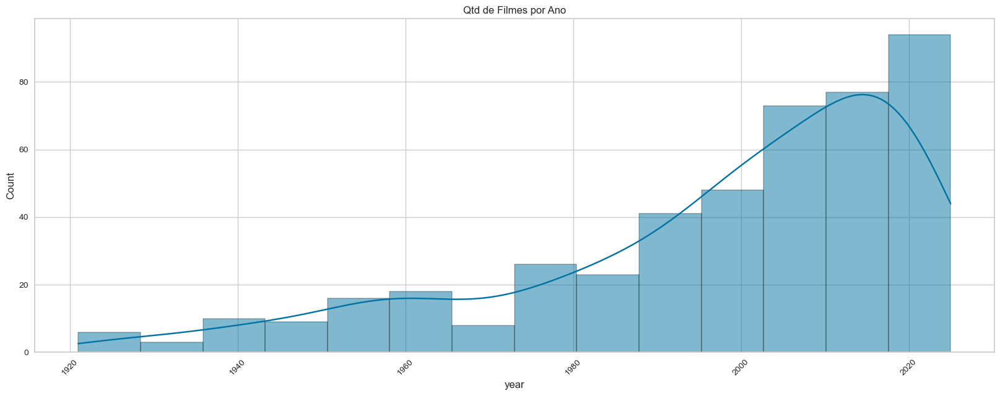

In [189]:
plt.figure(figsize = (20,7))
sns.histplot( df,
              x = 'year',
              kde = True).set_title('Qtd de Filmes por Ano')
plt.xticks(rotation=45)
plt.show()

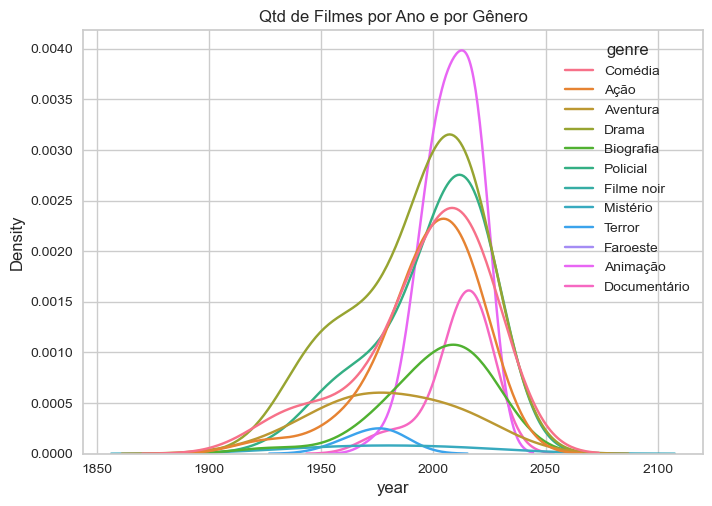

In [190]:
sns.kdeplot( df, x = 'year', hue = 'genre', bw_adjust = 1.5, warn_singular = False).set_title('Qtd de Filmes por Ano e por Gênero')
plt.show()

# Pré-processamento de texto

In [191]:
#convert sinopses to lowercase
df_processed = df.copy()
df_processed['sinopse'] = df_processed['sinopse'].str.lower()
df_processed['sinopse'].head()

0    um mendigo cuida de uma criança abandonada, ma...
1    um projecionista de cinema deseja ser um detet...
2    um garimpeiro vai ao klondike em busca de ouro...
3    uns espiões roubam a amada locomotiva de um en...
4    numa cidade futurística dividida entre os trab...
Name: sinopse, dtype: object

In [192]:
def qty_words(text):
    words= text.split()
    word_count = len(words)
    return word_count

In [195]:
df_processed.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 452 entries, 0 to 480
Data columns (total 6 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   title_pt  452 non-null    object 
 1   title_en  452 non-null    object 
 2   year      452 non-null    int64  
 3   rating    452 non-null    float64
 4   genre     452 non-null    object 
 5   sinopse   449 non-null    object 
dtypes: float64(1), int64(1), object(4)
memory usage: 24.7+ KB


In [196]:
print(df_processed.shape[0])
df_processed = df_processed.dropna(subset=['sinopse'])
df_processed.shape[0]

452


449

In [197]:
### Feature Engineering
df_processed['word_count'] = df_processed['sinopse'].apply(qty_words).astype('int64')
df_processed.head()

,title_pt,title_en,year,rating,genre,sinopse,word_count
0,O Garoto,131. O Garoto,1921,1921.0,Comédia,"um mendigo cuida de uma criança abandonada, ma...",13
1,Bancando o Águia,198. Bancando o Águia,1924,1924.0,Ação,um projecionista de cinema deseja ser um detet...,31
2,Em Busca do Ouro,183. Em Busca do Ouro,1925,1925.0,Aventura,um garimpeiro vai ao klondike em busca de ouro...,15
3,A General,191. A General,1926,1926.0,Ação,uns espiões roubam a amada locomotiva de um en...,17
4,Metrópolis,117. Metrópolis,1927,1927.0,Drama,numa cidade futurística dividida entre os trab...,20


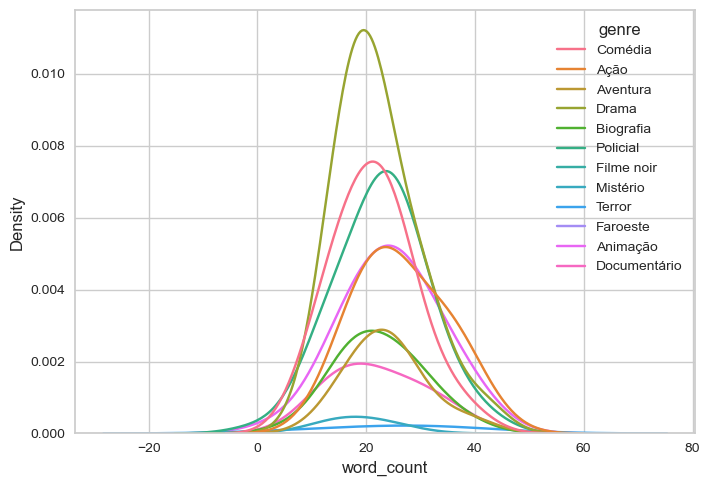

In [198]:
sns.kdeplot( df_processed, x = 'word_count', hue = 'genre', bw_adjust = 1.5, warn_singular = False)
plt.show()

## Nuvem de palavras

### Antes de remover as stopwords

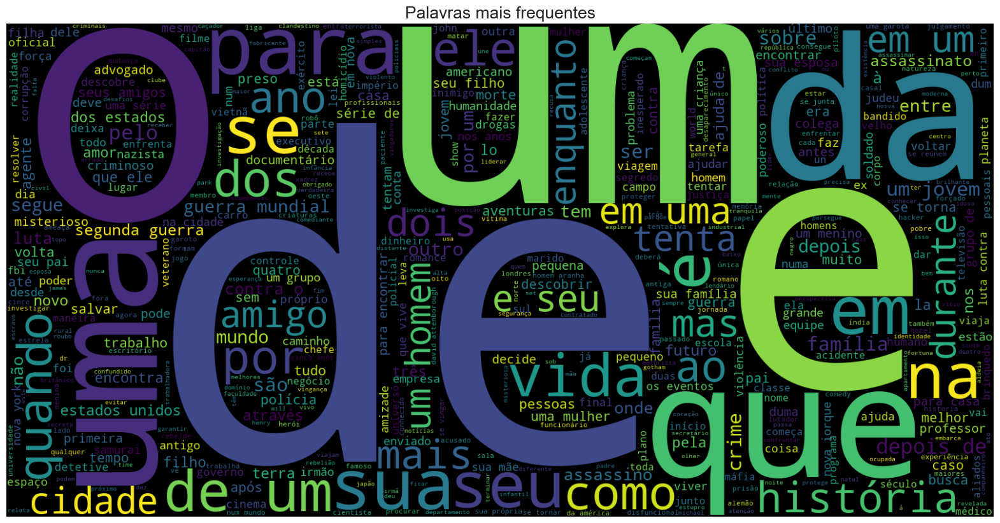

In [199]:
text = ' '.join([phrase for phrase in df_processed['sinopse']])
plt.figure(figsize=(20,15), facecolor='None')
wordcloud = WordCloud(max_words=500, width=1600, height=800).generate(text)
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.title('Palavras mais frequentes', fontsize = 19)
plt.show()

### Após remoção das stopwords

In [200]:
import nltk
nltk.download('stopwords')

stopwords = nltk.corpus.stopwords.words('portuguese')
print(stopwords)

['a', 'à', 'ao', 'aos', 'aquela', 'aquelas', 'aquele', 'aqueles', 'aquilo', 'as', 'às', 'até', 'com', 'como', 'da', 'das', 'de', 'dela', 'delas', 'dele', 'deles', 'depois', 'do', 'dos', 'e', 'é', 'ela', 'elas', 'ele', 'eles', 'em', 'entre', 'era', 'eram', 'éramos', 'essa', 'essas', 'esse', 'esses', 'esta', 'está', 'estamos', 'estão', 'estar', 'estas', 'estava', 'estavam', 'estávamos', 'este', 'esteja', 'estejam', 'estejamos', 'estes', 'esteve', 'estive', 'estivemos', 'estiver', 'estivera', 'estiveram', 'estivéramos', 'estiverem', 'estivermos', 'estivesse', 'estivessem', 'estivéssemos', 'estou', 'eu', 'foi', 'fomos', 'for', 'fora', 'foram', 'fôramos', 'forem', 'formos', 'fosse', 'fossem', 'fôssemos', 'fui', 'há', 'haja', 'hajam', 'hajamos', 'hão', 'havemos', 'haver', 'hei', 'houve', 'houvemos', 'houver', 'houvera', 'houverá', 'houveram', 'houvéramos', 'houverão', 'houverei', 'houverem', 'houveremos', 'houveria', 'houveriam', 'houveríamos', 'houvermos', 'houvesse', 'houvessem', 'houvésse

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\eduar\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


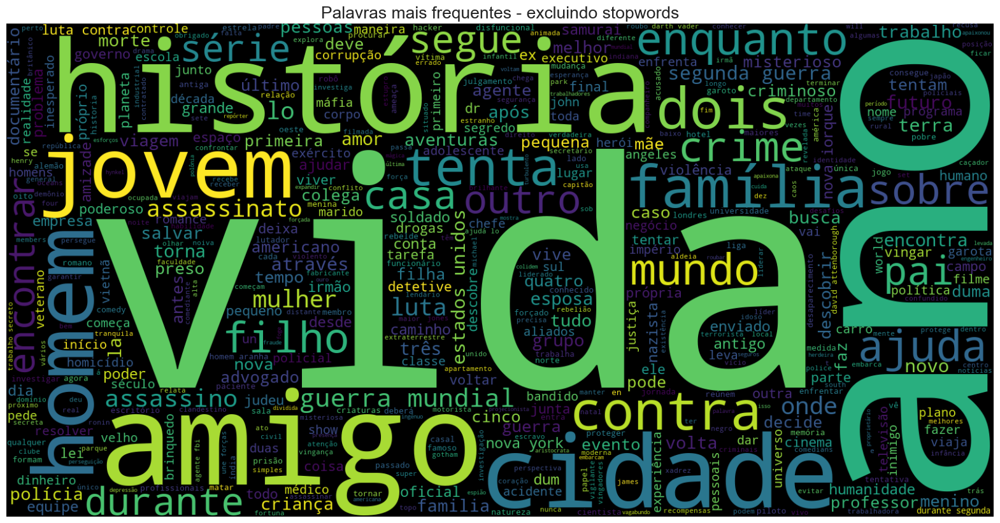

In [204]:
df_processed['sinopse_no_stopwords'] = df_processed['sinopse'].apply(lambda x: ' '.join([word for word in x.split() if word not in (stopwords)]))
text = ' '.join([phrase for phrase in df_processed['sinopse_no_stopwords']])
plt.figure(figsize=(20,15), facecolor='None')
wordcloud = WordCloud(max_words=500, width=1600, height=800).generate(text)
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.title('Palavras mais frequentes - excluindo stopwords', fontsize = 19)
plt.show()

## Aplicando TF-IDF
Term Frequency-Inverse Document Frequency

O TF-IDF define a importância de um termo levando em consideração a importância desse termo em um único documento e dimensionando-o por sua importância em todos os documentos.

In [205]:
# initialize the vectorizer
vectorizer = TfidfVectorizer(sublinear_tf=True, min_df=5, max_df=0.95)
# fit_transform applies TF-IDF to clean texts - we save the array of vectors in X
X = vectorizer.fit_transform(df_processed['sinopse_no_stopwords'])

In [206]:
print(X.shape)
X.toarray()

(449, 177)


array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]])

# KMeans - Clusterização

## Escolhendo o numero de "k" clusters ideal

### Método Elbow

C:\Users\eduar\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



2 421.6542202833025
3 414.0727195093366
4 408.2171862943144
5 403.8329233316146
6 395.0404066823588
7 393.0666294678136
8 390.5172722440669
9 386.52533155011264
10 379.53267389850896
11 376.96513821107976
12 372.2975644888965


Text(0, 0.5, 'WCSS')

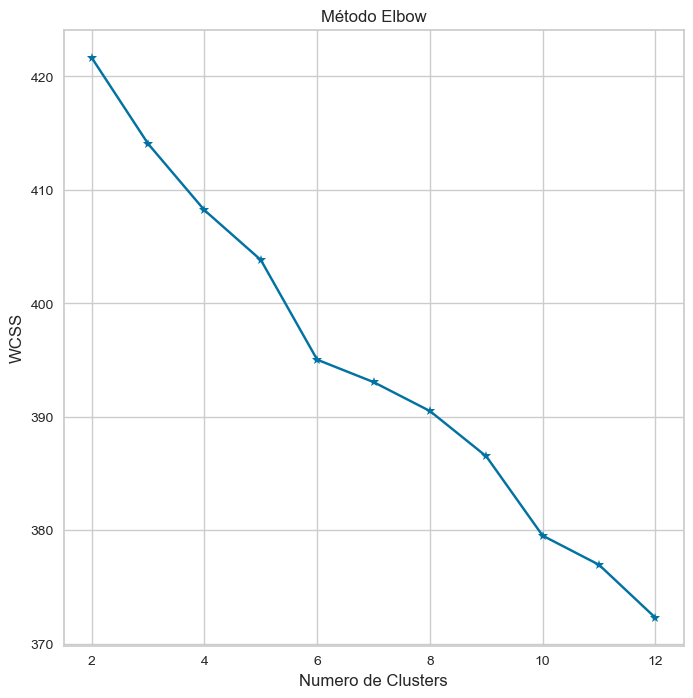

In [207]:
plt.figure(figsize = (8,8))

#plotando o grafico do método elbow
wcss = []

for i in range(2, df_processed.genre.nunique()+1):
  kmeans = KMeans(n_clusters = i, init = 'random')
  kmeans.fit(X)
  print(i, kmeans.inertia_)
  wcss.append(kmeans.inertia_)
    

plt.plot(range(2, df_processed.genre.nunique()+1), wcss, '*-')
plt.title('Método Elbow')
plt.xlabel('Numero de Clusters')
plt.ylabel('WCSS') #within cluster sum of square


### Método Silhouette

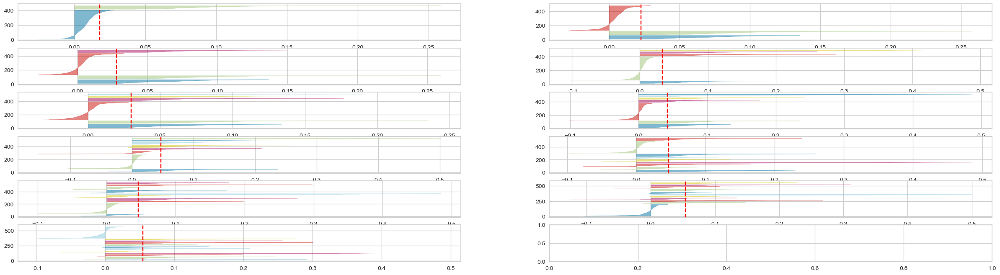

In [216]:
fig, ax = plt.subplots(6,2, figsize = (30,8))
for i in (range(2, df_processed.genre.nunique()+1)):
  #Creating KMeans instance for different number of clusters
  kmeans = KMeans(n_clusters = i, init = 'k-means++', n_init = 10, max_iter = 100, random_state = 42)
  q, mod = divmod(i,2)

  #Creating SilhouetteVisualizer instance with KMeans instance
  #Fit the visualizer

  visualizer = SilhouetteVisualizer(kmeans, colors = 'yellowbrick', ax = ax[q-1][mod])
  visualizer.fit(X)

### Análise do número de clusters | k = 6
* Tanto ambos métodos não mostraram claramente o numero ideal de clusters, provavelmente em função do numero reduzido de amostras existentes no dataset (250). Para fins didáticos será assumido o numero de k = 6.

# Comparativo entre os 6 clusters

In [221]:
# initialize kmeans with 5 centroids
kmeans = KMeans(n_clusters=5, random_state=42)
# fit the model
kmeans = kmeans.fit(X)
#predicting the clusters and store cluster labels in a variable
labels = kmeans.predict(X)
#getting the cluster centers
c = kmeans.cluster_centers_

df_processed['cluster'] = labels
df_processed.head()

C:\Users\eduar\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



,title_pt,title_en,year,rating,genre,sinopse,word_count,sinopse_no_stopwords,cluster
0,O Garoto,131. O Garoto,1921,1921.0,Comédia,"um mendigo cuida de uma criança abandonada, ma...",13,"mendigo cuida criança abandonada, eventos amea...",1
1,Bancando o Águia,198. Bancando o Águia,1924,1924.0,Ação,um projecionista de cinema deseja ser um detet...,31,projecionista cinema deseja detetive coloca ma...,1
2,Em Busca do Ouro,183. Em Busca do Ouro,1925,1925.0,Aventura,um garimpeiro vai ao klondike em busca de ouro...,15,garimpeiro vai klondike busca ouro encontra isso.,1
3,A General,191. A General,1926,1926.0,Ação,uns espiões roubam a amada locomotiva de um en...,17,uns espiões roubam amada locomotiva engenheiro...,1
4,Metrópolis,117. Metrópolis,1927,1927.0,Drama,numa cidade futurística dividida entre os trab...,20,cidade futurística dividida trabalhadores plan...,1


## Filmes por cluster

In [222]:
fig = px.bar(df_processed.cluster.value_counts(),
             text_auto = True,
             title = 'Qtd de Filmes por Cluster',
             labels = {'index': 'Cluster #',
                       'value':'Qtd. de Filmes'})
fig.show()

## % de Gêneros por Cluster

C:\Users\eduar\anaconda3\lib\site-packages\seaborn\categorical.py:3201: UserWarning:

Setting `sharex=False` with `color=None` may cause different levels of the `x` variable to share colors. This will change in a future version.



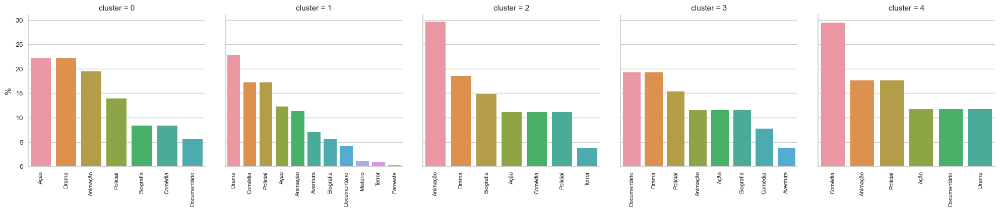

In [223]:
df_plot = df_processed.groupby(['cluster', 'genre'])['title_pt'].count()
df_plot = df_plot.reset_index()
df_plot.rename(columns = {'title_pt':'count'}, inplace = True)
df_plot['%'] = 100 * df_plot['count'] / df_plot.groupby('cluster')['count'].transform('sum')
df_plot = df_plot.sort_values(['cluster', '%'], ascending = False).groupby('cluster').head(11)

fig = sns.catplot(
    data=df_plot, x="genre", y = "%", col="cluster",
    kind="bar", height=4, aspect=1, sharex = False);
fig.set_xlabels('');
fig.set_xticklabels(rotation=90, size = 8);

## Ano de Lançamento por Cluster

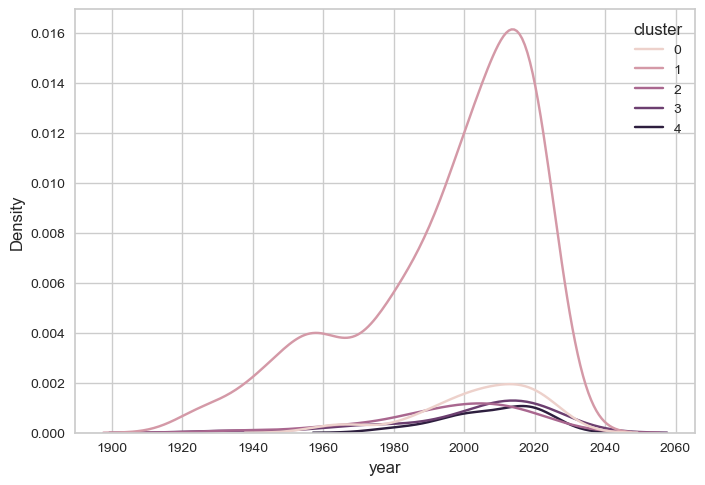

In [225]:
sns.kdeplot(df_processed, x = 'year', hue = 'cluster');

## Radar | Gêneros por Cluster

In [224]:
df_pivot = df_plot.copy()
df_pivot = df_pivot.pivot(index = 'cluster', columns = 'genre', values = '%')
df_pivot.fillna(0, inplace = True)
df_pivot = df_pivot.T.reset_index()
df_pivot.index.name = None
df_pivot

cluster,genre,0,1,2,3,4
0,Animação,19.444444,11.370262,29.629630,11.538462,17.647059
1,Aventura,0.000000,6.997085,0.000000,3.846154,0.000000
2,Ação,22.222222,12.244898,11.111111,11.538462,11.764706
3,Biografia,8.333333,5.539359,14.814815,11.538462,0.000000
4,Comédia,8.333333,17.201166,11.111111,7.692308,29.411765
5,Documentário,5.555556,4.081633,0.000000,19.230769,11.764706
6,Drama,22.222222,22.740525,18.518519,19.230769,11.764706
7,Faroeste,0.000000,0.291545,0.000000,0.000000,0.000000
8,Mistério,0.000000,1.166181,0.000000,0.000000,0.000000
9,Policial,13.888889,17.201166,11.111111,15.384615,17.647059


In [227]:
df_polar = df_pivot.melt(id_vars=['genre'])
df_polar.head()

,genre,cluster,value
0,Animação,0,19.444444
1,Aventura,0,0.000000
2,Ação,0,22.222222
3,Biografia,0,8.333333
4,Comédia,0,8.333333


In [228]:
fig = px.line_polar(df_polar, r='value', theta='genre', color = 'cluster', line_close=True)
fig.show();

C:\Users\eduar\anaconda3\lib\site-packages\plotly\express\_core.py:271: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

C:\Users\eduar\anaconda3\lib\site-packages\plotly\express\_core.py:271: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

C:\Users\eduar\anaconda3\lib\site-packages\plotly\express\_core.py:271: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

C:\Users\eduar\anaconda3\lib\site-packages\plotly\express\_core.py:271: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.

C:\Users\eduar\anaconda3\lib\site-packages\plotly\express\_core.py:271: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future ve

# Nuvem de Palavras por Cluster

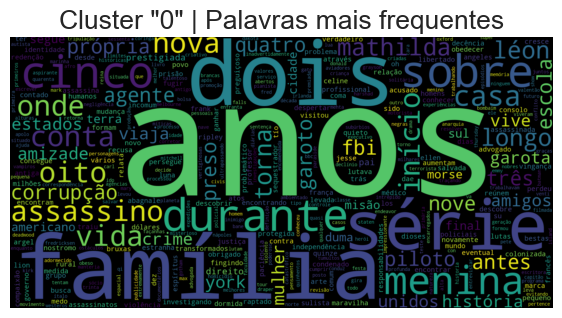

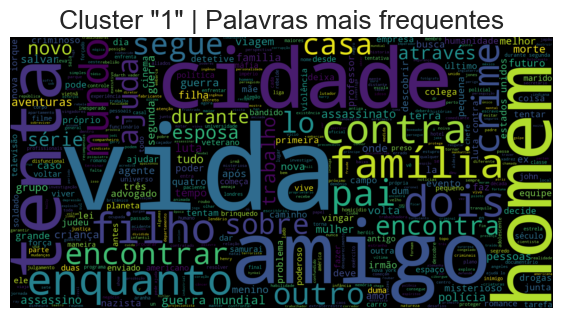

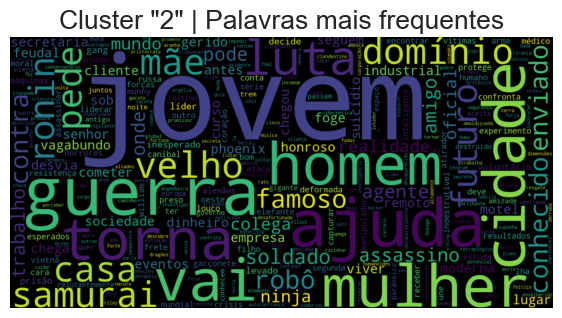

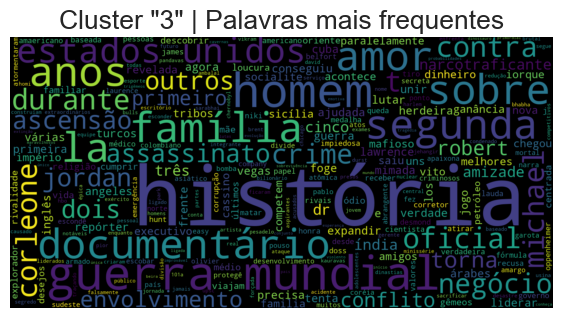

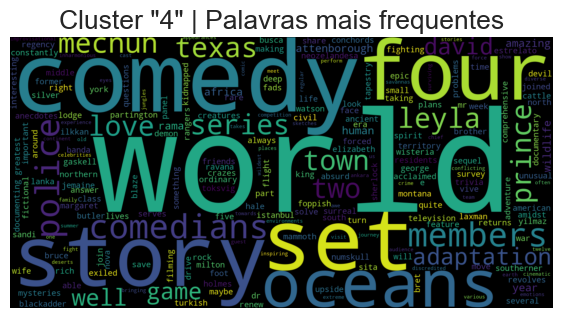

In [230]:
def word_cloud_cluster(cluster:int):
  text = ' '.join([phrase for phrase in df_processed.loc[df_processed.cluster == cluster]['sinopse_no_stopwords']])
  plt.figure(figsize=(7,5), facecolor='None')
  wordcloud = WordCloud(max_words=500, width=1600, height=800).generate(text)
  plt.imshow(wordcloud, interpolation='bilinear')
  plt.axis('off')
  plt.title(f'Cluster "{cluster}" | Palavras mais frequentes', fontsize = 19)
  plt.show()
  return

for c in range(5):
  word_cloud_cluster(c)

# Considerações Finais

** Na seção "Comparativo entre os 5 clusters" foram apresentadas diferentes formas de caracterizar cada cluster.**

1. Primeiro foi demonstrado que o cluster #2 foi o que apresentou o maior número de amostras (filmes). _(Idealmente os cluster devem conter quantidades balanceadas, porém neste projeto, por ter um dataset com baixo número de amostras (250), não foi possível atender esta premissa)_.

2. Depois foi analisado o % de cada gênero por cluster, sendo os dois gêneros mais representativos do:

  2.1 Cluster 0: Animação e Drama

  2.2 Cluster 1: Biografia e Aventura

  2.3 Cluster 2: Drama e Ação

  2.4 Cluster 3: Drama e Biografia

  2.5 Cluster 4: Drama e Comédia


3. Na sequência foi avaliado a distribuição dos anos de lançamento dos filmes por cluster, sem diferença siginificativa entre eles, com maior concentração ao redor do ano 2000.

4. Depois foi apresentado um gráfico de radar por cluster, onde a exemplo do item 2, é possível avaliar a representatividade de cada gênero por cluster.

5. E finalmente, foram apresentadas as nuvens de palavras por cluster, onde em linhas gerais destacam-se:

  5.1 o Cluster 0 com temas sobre Guerra Mundial, Luta, Judeus, Alemães

  5.2 O Cluster 1 e 3 com temas de disputa como Contra, Morte, Advogado, Homem,Polícia

  5.3 o Cluster 2 com temas do cotidiano como Filhos, Amigos, Ajuda, Jovem, Família

  5.4 o Cluster 4 com temas de auto-conhecimento como Busca, Encontrar, Descobrir, Casa, Terra


** Em resumo neste projeto foram aplicados conceitos de:

1. Webscraping / Crawler para coleta de dados do site IMDb
2. Pré-processamento de texto com utilização de técnicas de NLP
3. Clusterização

Desta forma consideramos que o objetivo inicial foi atingido sendo possível a clusterização dos filmes baseado na sinopse / descrição de cada um, gerando desta forma a possibilidade de recomendar filmes aos usuários não apenas pela classificação tradicional por gêneros, mas também pelos clusters identificados neste projeto.

**Em termos práticos, se um usuário avalia positivamente um filme, os filmes pertecentes ao mesmo cluster podem ser recomendados a ele.**